# Constants

In [2]:
import os
#os.environ['CUDA_VISIBLE_DEVICES'] = '1' # only relevant to my own environment

I assume that you have downloaded MIDI dataset and uncompssed into `./midi_dataset/groove/` folder  
https://magenta.tensorflow.org/datasets/groove

In [3]:
DRUM_CLASSES = [
   'Kick',
   'Snare',
   'Hi-hat closed',
   'Hi-hat open',
   'Tom low',
   'Tom mid', 
   'Tom high',
   'Clap',
   'Rim' 
]
MIDI_DRUM_MAP = {
   36: 0,
   35: 0,
   38: 1,
   27: 1,
   28: 1,
   31: 1,
   32: 1,
   33: 1,
   34: 1,
   37: 1,
   39: 1,
   40: 1,
   56: 1,
   65: 1,
   66: 1,
   75: 1,
   85: 1,
   42: 2,
   44: 2,
   54: 2,
   68: 2,
   69: 2,
   70: 2,
   71: 2,
   73: 2,
   78: 2,
   80: 2,
   46: 3,
   67: 3,
   72: 3,
   74: 3,
   79: 3,
   81: 3,
   45: 4,
   29: 4,
   41: 4,
   61: 4,
   64: 4,
   84: 4,
   48: 5,
   47: 5,
   60: 5,
   63: 5,
   77: 5,
   86: 5,
   87: 5,
   50: 6,
   30: 6,
   43: 6,
   62: 6,
   76: 6,
   83: 6,
   49: 7,
   55: 7,
   57: 7,
   58: 7,
   51: 8,
   52: 8,
   53: 8,
   59: 8,
   82: 8
}

DRUM_MIDI_MAP = [ # pianoroll to MIDI - reverse
    36, # 0 Kick
    38, # 1 Snare
    42, # 2 Hihat Closed
    46, # 3 Hihat Open
    45, # 4 Tom Low
    47, # 5 Tom Mid
    50, # 6 Tom High
    49, # 7 Clap
    51  # 8 Rim
]

resolution  = 4 # separate quater into 4  = 16 notes per bar

nb_bars = 2 

len_seq = resolution * 4 * nb_bars # length of drumloops in training data - 2 bars
    
nb_notes = len(DRUM_CLASSES) # number of possible MIDI notes  - max_drum_note - min_drum_note


# Training

In [4]:
import numpy as np

# load pianoroll matrix - see "0_preprocess_midi.ipynb"

matrices_drums = np.load("./tmp/matrices_drum_gm_electronic.npz")['drum_data']
matrices_genres = np.load("./tmp/matrices_drum_gm_electronic.npz")['genre_ids']
GENRES_ALL = np.load("./tmp/matrices_drum_gm_electronic.npz")['genres']

print(GENRES_ALL)
print(matrices_genres.shape)

# Filter genres 
GENRES_USED = [u'Old Skool', u'DnB', u'Jungle', u'House', u'Breakbeat', u'Garage', u'Techno']
GENRES_ID_USED = [i for i, genre in enumerate(GENRES_ALL) if genre in GENRES_USED]
GENRES = [genre for i, genre in enumerate(GENRES_ALL) if genre in GENRES_USED]
NB_GENRES = len(GENRES)

print(GENRES_ID_USED)
print(NB_GENRES, GENRES)

_drums = []
_genres = []

for genre_id, drum in zip(matrices_genres, matrices_drums):
    if genre_id in GENRES_ID_USED:
        _drums.append(drum)
        genre_id = GENRES_ID_USED.index(genre_id)
        _genres.append(genre_id)

matrices_drums = np.array(_drums)
print(matrices_drums.shape)
matrices_genres = np.array(_genres)
print(matrices_genres.shape)


['Old Skool' 'Trance' 'DnB' 'Basic' 'Downtempo' 'Jungle' 'House'
 'Breakbeat' 'Garage' 'Techno']
(49003,)
[0, 2, 5, 6, 7, 8, 9]
7 ['Old Skool', 'DnB', 'Jungle', 'House', 'Breakbeat', 'Garage', 'Techno']
(37950, 32, 9)
(37950,)


In [5]:
np.max(matrices_genres)

6

## Discriminator

In [16]:
import numpy as np
from keras.layers import Input, Dense, Flatten, Dropout, Reshape, LSTM, Bidirectional
from keras.layers import Embedding, Concatenate
from keras.layers.convolutional import Conv2D

from keras.layers.normalization import BatchNormalization
from keras.layers.advanced_activations import LeakyReLU
from keras.optimizers import RMSprop, Adam
import keras.backend as K
from keras.models import Model, Sequential

batch_size = 16
n_z = 4
dropout_rate = 0.30

# encoder
drum_input = Input(shape=(len_seq, nb_notes), name='drum_input')  # tensorflow order

# Conditioning label:
# Integer 0-NB_GENRES denoting the genre G should generate
label_input = Input(shape=(1,), dtype='int32')

# Embedding layer:
# Turns labels into dense vectors of size z_dim
# Produces 3D tensor with shape: (batch_size, 1, 28*28*1)
label_embedding = Embedding(NB_GENRES, np.prod((len_seq, nb_notes)), input_length=1)(label_input)

# Flatten the embedding 3D tensor into 2D tensor with shape:(batch_size, 28*28*1)
label_embedding = Flatten()(label_embedding)

# Reshape label embeddings to have same dimensions as input images
label_embedding = Reshape((len_seq, nb_notes))(label_embedding)

# Concatenate images with corresponding label embeddings
concatenated = Concatenate(axis=-1)([drum_input, label_embedding])


x = Bidirectional(LSTM(64, return_sequences=True, activation='tanh'))(concatenated) 
x = Bidirectional(LSTM(128, return_sequences=True, activation='tanh'))(x)
x = Bidirectional(LSTM(16, return_sequences=True, activation='tanh'))(x)
x = Reshape((1024,))(x)
# x = Dense(512)(x)
# x = LeakyReLU(alpha=0.01)(x)
x = Dense(256)(x)
x = LeakyReLU(alpha=0.01)(x)
output = Dense(1, activation='sigmoid')(x)

discriminator = Model([drum_input, label_input], output)
discriminator.summary()

optimizer = Adam(lr=0.00001) # higher leraning rate for D
discriminator.compile(optimizer=optimizer, loss='binary_crossentropy', 
                      metrics=['accuracy'])

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 1)            0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 1, 288)       2016        input_1[0][0]                    
__________________________________________________________________________________________________
flatten_1 (Flatten)             (None, 288)          0           embedding_1[0][0]                
__________________________________________________________________________________________________
drum_input (InputLayer)         (None, 32, 9)        0                                            
____________________________________________________________________________________________

## GENERATOR 

In [17]:
from keras.layers import Reshape, Conv2DTranspose, RepeatVector, Activation,Bidirectional,multiply
from keras.layers.normalization import BatchNormalization
from keras.layers.convolutional import UpSampling2D

len_input = 100

z_input = Input(shape=(len_input,))  # tensorflow order

# Conditioning label
label_input = Input(shape=(1,), dtype='int32')
label_embedding = Embedding(NB_GENRES, len_input, input_length=1)(label_input)
label_embedding = Flatten()(label_embedding)

# Element-wise product of the vectors z and the label embeddings
inputs2 = multiply([z_input, label_embedding])

# 
x = Dense(512)(inputs2)
x = LeakyReLU(alpha=0.2)(x)
x = BatchNormalization(momentum=0.9)(x)
x = Dense(1024)(x)
x = LeakyReLU(alpha=0.2)(x)
x = BatchNormalization(momentum=0.9)(x)
x = Reshape((32, 32))(x)
x = Dropout(dropout_rate)(x)

x = LSTM(128, return_sequences=True, activation='tanh')(x) 
x = LSTM(128, return_sequences=True, activation='tanh')(x)
x = LSTM(9, return_sequences=True)(x)
note_out = LeakyReLU()(x)

generator = Model([z_input, label_input], note_out)
generator.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 1)            0                                            
__________________________________________________________________________________________________
embedding_2 (Embedding)         (None, 1, 100)       700         input_3[0][0]                    
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 100)          0                                            
__________________________________________________________________________________________________
flatten_2 (Flatten)             (None, 100)          0           embedding_2[0][0]                
____________________________________________________________________________________________

## ADVERSARIAL MODEL 

In [7]:

from keras.models import Sequential


# define input for the combined GAN model
z_input = Input(shape=(len_input,))  # tensorflow order
label_input = Input(shape=(1,), dtype='int32')
img_gan = generator([z_input, label_input])

# training is disable for discriminator in adversarial model
discriminator.trainable = False 

# define output
prediction_gan = discriminator([img_gan, label_input])

# define combined GAN model
gan = Model([z_input, label_input], prediction_gan)
optimizer = Adam(lr=0.0001)
gan.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['binary_accuracy'])
gan.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            (None, 100)          0                                            
__________________________________________________________________________________________________
input_5 (InputLayer)            (None, 1)            0                                            
__________________________________________________________________________________________________
model_2 (Model)                 (None, 32, 9)        802852      input_4[0][0]                    
                                                                 input_5[0][0]                    
__________________________________________________________________________________________________
model_1 (Model)                 (None, 1)            605281      model_2[1][0]              

In [8]:
gan.metrics_names

['loss', 'binary_accuracy']

## Training

In [6]:
from IPython.display import clear_output
import matplotlib.pyplot as plt
%matplotlib inline

import random
import pretty_midi
from IPython.display import Audio
from scipy.io import wavfile

# Create Z for generator
def get_noise(batch_size, len_input):
#    noise = np.random.uniform(-1.0, 1.0, size=[batch_size, len_input])
    
    # better to use a spherical Z. according to https://github.com/soumith/ganhacks
    noise = np.random.normal(0.0, 1.0, size=[batch_size, len_input])
    return noise

def plot_drum_matrix(a, threshold=0.0):
    if a is not None:
        a[a < threshold] = 0.0
        
        a = np.transpose(np.squeeze(a))
        plt.matshow(a)
        plt.show()  
        
        import pretty_midi

def play_drum_matrix(mat, tempo=120.0, threshold=0.0):
    # generate audio
    audio_data = get_audio_from_drum_matrix(mat, tempo=tempo, threshold=threshold)
    display(Audio(audio_data, rate=44100))
    return audio_data

def get_audio_from_drum_matrix(mat, tempo=120., threshold=0.0):
    pm = pretty_midi.PrettyMIDI(initial_tempo=tempo) # midi object
    pm_inst = pretty_midi.Instrument(0, is_drum=True) # midi instrument
    
    timestep = (60./tempo) / 4. # duration of a 16th note
    for position, timeslot in enumerate(mat):
        for inst, onset in enumerate(timeslot):
            if onset >threshold:
                note_number = DRUM_MIDI_MAP[inst]
                velocity = int(onset * 127.)
                start = timestep * position
                end = timestep * (position + 0.5)
                
                # create a midi note
                note = pretty_midi.Note(velocity=velocity, pitch=note_number, start=start, end=end)
                pm_inst.notes.append(note)
    pm.instruments.append(pm_inst)

    # midi -> audio
    audio_data = pm.fluidsynth()
    return audio_data

In [12]:
from tensorboard_logger import configure, log_value

from datetime import datetime
now = datetime.now()
logdir_prefix = "/tmp/tf_logs_cgan/"
logdir = logdir_prefix + now.strftime("%Y%m%d-%H%M%S") 
cmd = "tensorboard --logdir=" + logdir_prefix
print (cmd)

configure(logdir, flush_secs=5)

tensorboard --logdir=/tmp/tf_logs_cgan/


In [ ]:

batch_size = 32
nb_epochs = 300
nb_samples = matrices_drums.shape[0]

K_unrolled = 4
MAX_LOSS_RATIO = 3.0

# Labels for real images: all ones
real_labels = np.ones((batch_size, 1)) * 0.9

# Labels for fake images: all zeros
fake_labels = np.zeros((batch_size, 1))

train_d = True
train_g = True

for epoch in range(nb_epochs):
    
    nb_steps = int(nb_samples/batch_size)
    for repeat in range(nb_steps):
        
        step = nb_steps * epoch + repeat
        
        if train_d:
            
            m_d_loss = 0.0
            m_d_accuracy = 0.0
            
            for j in range(K_unrolled):
                # training data
                random_indices = np.random.randint(0, matrices_drums.shape[0], size=batch_size)
                drum_train = matrices_drums[random_indices, :, :]
                labels_traing = matrices_genres[random_indices]

                # generated samples
                noise = get_noise(batch_size, len_input)
                drum_fake = generator.predict([noise, labels_traing])

                # training D
    #             x = np.concatenate([drum_train, drum_fake])        
    #             y = np.ones([2 * batch_size, 1])
    #             y[:batch_size, :] = 0.9 # one-sided soft labeling
    #             y[batch_size:, :] = 0 # label 0: fake 1: real
                d_loss_real = discriminator.train_on_batch([drum_train, labels_traing], real_labels)
                d_loss_fake = discriminator.train_on_batch([drum_fake,labels_traing], fake_labels)
                d_loss, d_accuracy = 0.5 * np.add(d_loss_real, d_loss_fake)

                m_d_loss += d_loss
                m_d_accuracy += d_accuracy

                # cache for later update
    #             cache_weights = discriminator.get_weights()
          
            m_d_loss /= float(K_unrolled)
            m_d_accuracy /= float(K_unrolled)
            
        # store value
        log_value("D loss", m_d_loss, step)  
        log_value("D accuracy", m_d_accuracy, step)  
        
        # training G
        
        if train_g:
            y = np.ones([batch_size, 1]) # watch out the label! it should be one here        

            noise = get_noise(batch_size, len_input)
            # Get a batch of random labels
            labels_random = np.random.randint(0, NB_GENRES, batch_size).reshape(-1, 1)
            a_loss, a_acc = gan.train_on_batch([noise, labels_random], y)
                 
        # store value
        log_value("G loss", a_loss, step)
        log_value("G accuracy", a_acc, step)
                    
        if train_d and train_g:
            if a_loss / m_d_loss > MAX_LOSS_RATIO:
                train_d = False
                print ("Pausing D")
            elif m_d_loss / a_loss > MAX_LOSS_RATIO:
                train_g = False
                print ("Pausing G")
        else:
            train_d = True
            train_g = True
            
        # update layer 
#         discriminator.set_weights(cache_weights)
    
        if repeat % 100 == 0:            
            print("epoch", epoch, repeat)
            print("d_loss", m_d_loss, "a_loss", a_loss) # print mean loss)
            print("d_accuracy", m_d_accuracy )
                        
            # sample output
            noise = get_noise(1, len_input)
            labels_random = np.random.randint(0, NB_GENRES, 1).reshape(-1, 1)
            drum_generated = generator.predict([noise, labels_random])
            
            genre = GENRES[int(labels_random)]
            print (labels_random, genre)
            plot_drum_matrix(drum_generated)
            
            # sample audio output
            audio_data = play_drum_matrix(np.squeeze(drum_generated))
            wavfile.write("audio/c_drum_%s_%05d_%05d.wav" % (genre, epoch, repeat), 44100, audio_data)
            
            print()
            print()
            
                        
    # store temporary models
    if (epoch + 1) % 5 == 0:
        generator.save("./tmp/c_generator-epoch-%03d-%0.5f.h5" % (epoch, a_loss))
        #gan.save("./tmp/c_gan-epoch-%03d-%0.5f.h5" % (epoch, a_loss))
        #discriminator.save("./tmp/c_discriminator-epoch-%03d-%0.5f.h5" % (epoch, m_d_loss))
        clear_output(wait=True) # clear here

In [47]:
from glob import glob
from pathlib import Path
filelist = glob("./tmp/c_generator-epoch-*.h5")

length = len("c_generator-epoch-019-")

# find generator with the minimum loss
losses = np.array([float(Path(filepath).stem[length:]) for filepath in filelist])

# for i in np.argsort(losses)[:10]:
#     filepath = filelist[i]
#     print(filepath)
    
filepath = filelist[np.argsort(losses)[ 5]]
print(filepath)

./tmp/c_generator-epoch-029-1.37213.h5


In [48]:
from keras.models import load_model

generator_test = load_model(filepath)

In [49]:
GENRES

['Old Skool', 'DnB', 'Jungle', 'House', 'Breakbeat', 'Garage', 'Techno']

Old Skool


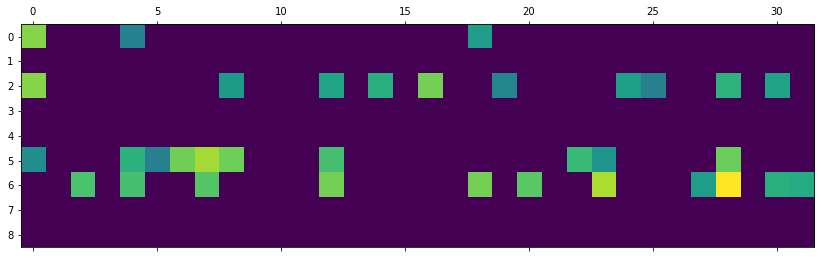

Old Skool


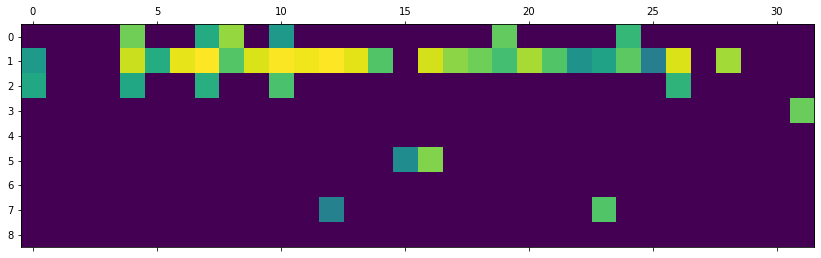

Old Skool


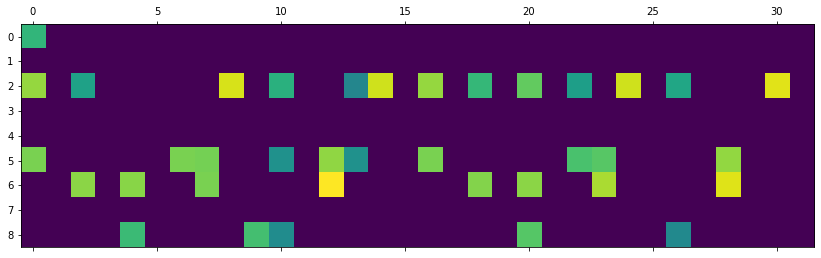

DnB


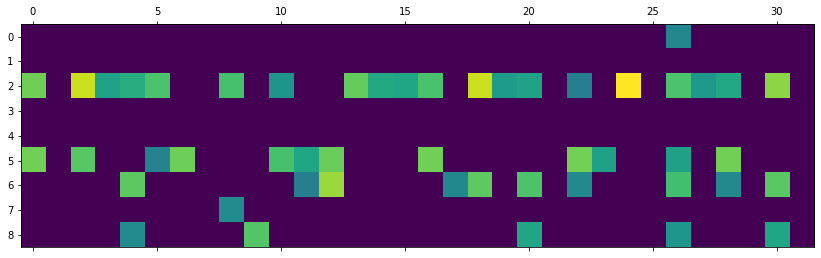

DnB


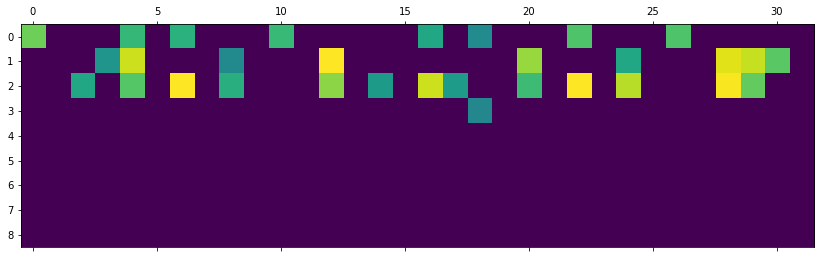

DnB


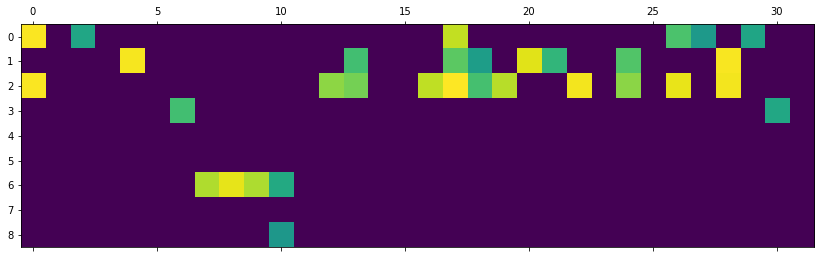

Jungle


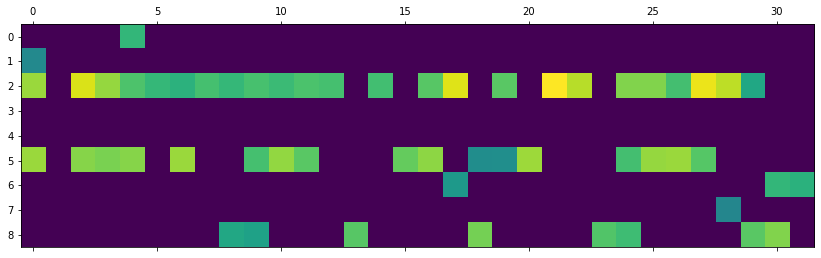

Jungle


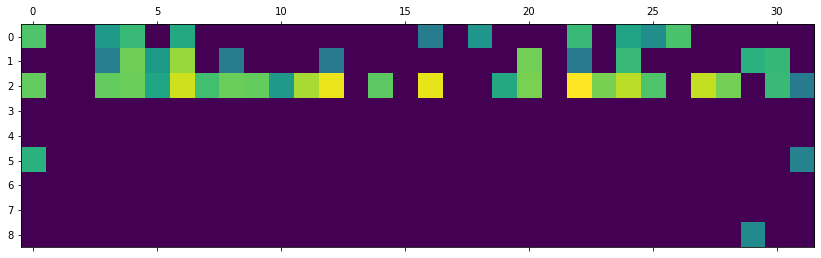

Jungle


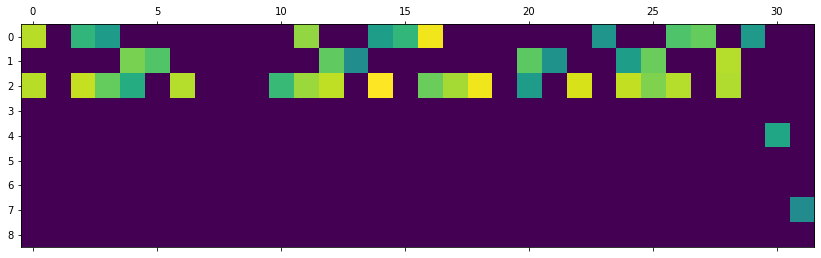

House


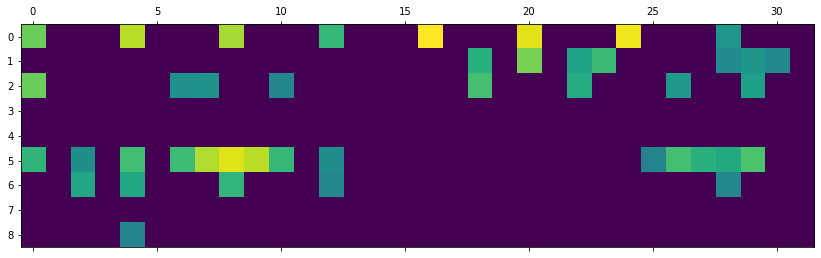

House


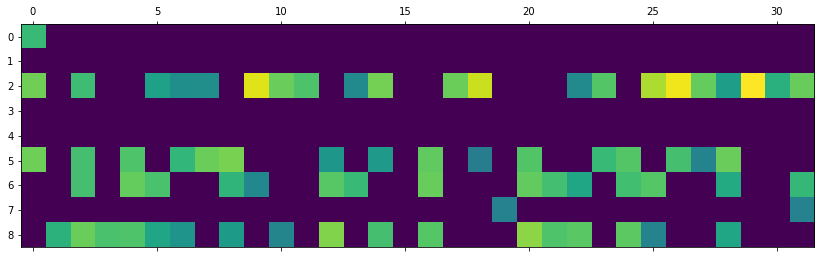

House


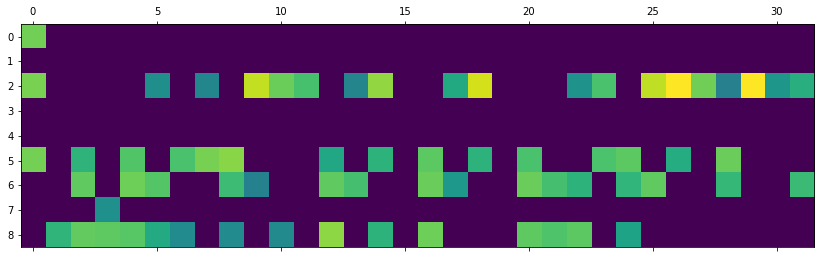

Breakbeat


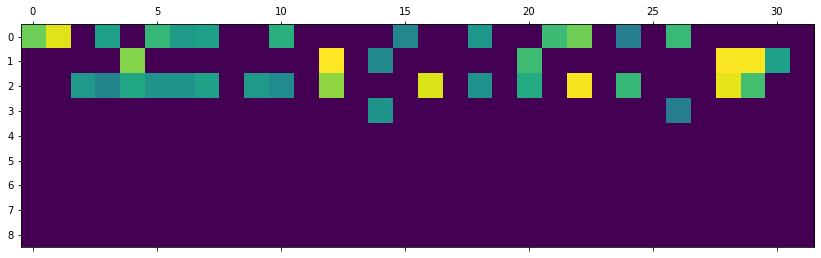

Breakbeat


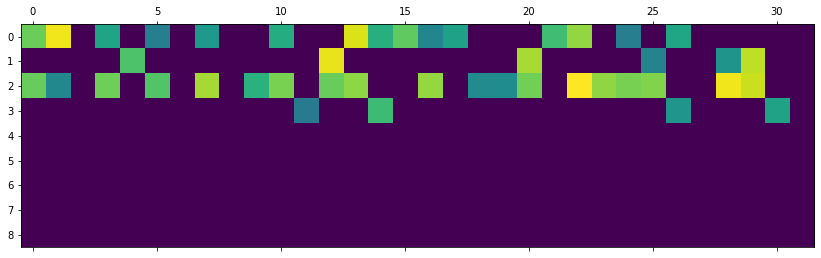

Breakbeat


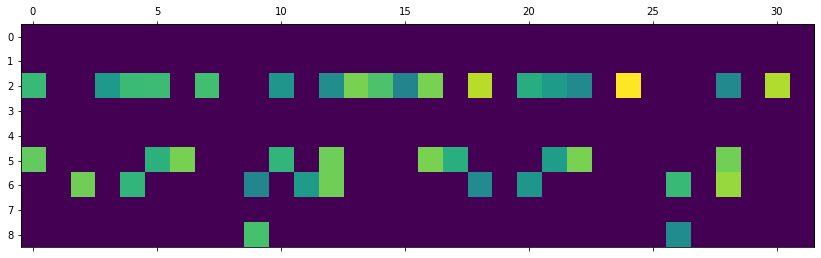

Garage


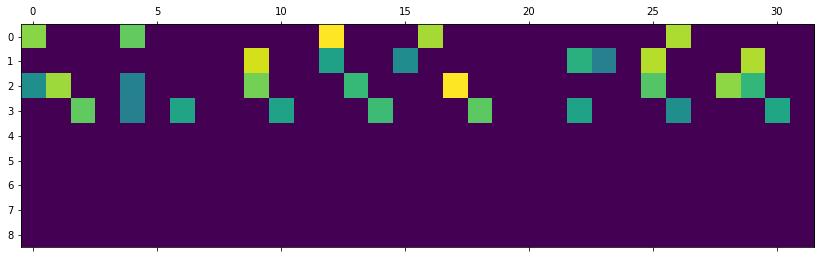

Garage


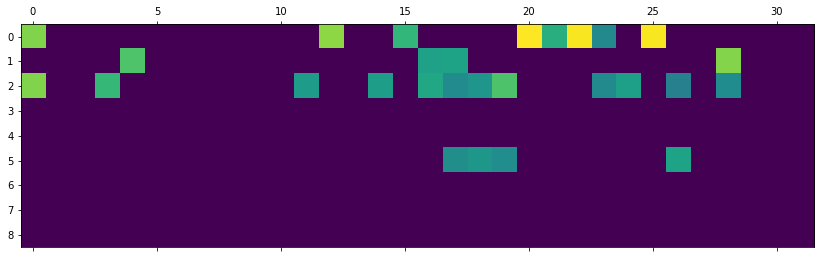

Garage


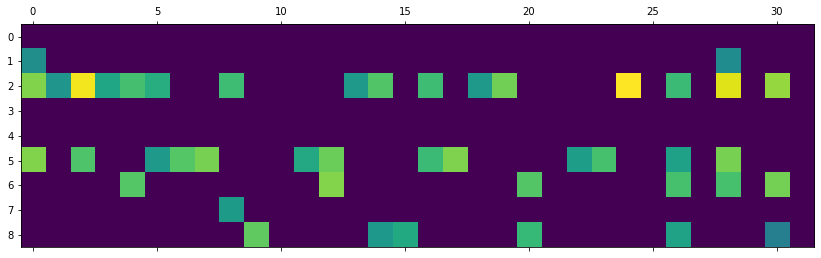

Techno


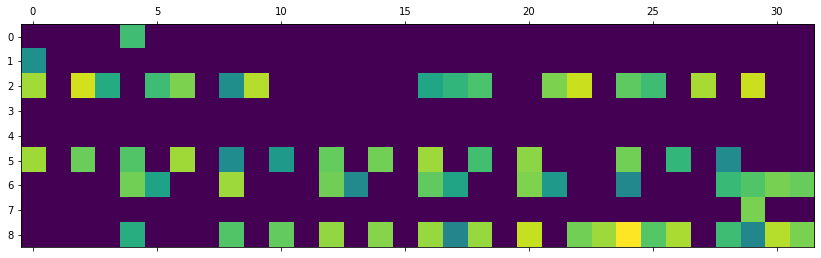

Techno


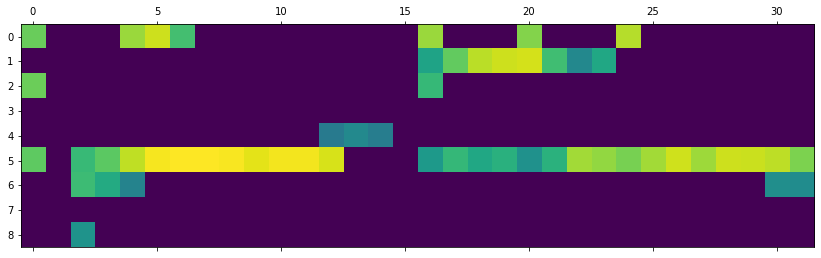

Techno


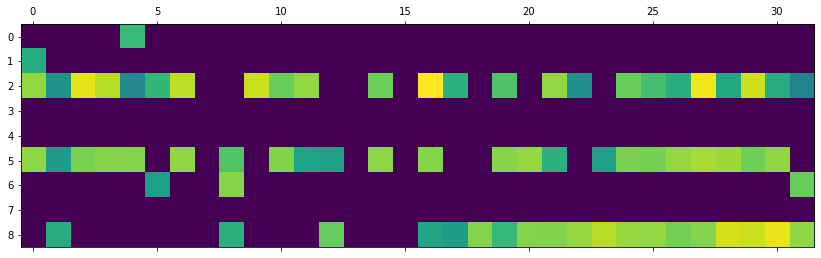

In [50]:
thresh = 0.4

for i in range(len(GENRES)):
    for _ in range(3):
        noise = get_noise(1, len_input)
    #    labels_random = np.random.randint(0, NB_GENRES, 1).reshape(-1, 1)
        labels_random = np.array(i).reshape(-1, 1)
        print(GENRES[i])
        drum_generated = generator_test.predict([noise, labels_random])
        plot_drum_matrix(drum_generated, threshold=thresh)
        play_drum_matrix(np.squeeze(drum_generated), tempo=140, threshold=thresh)

# MIDI Playback

In [ ]:
# midi playback
def note_matrix_to_sequence(mat, threshold = 0.5):
    seq = []
    for row in mat[:]:
        arow = [[i, r] for i, r in enumerate(row) if r > threshold]
        seq.append(arow)
    return seq

import OSC
max_poly = 6 # maximum number of instruments played at the same time

client = OSC.OSCClient()
client.connect( ('10.0.1.14', 2014) ) 

def send_sequence_via_osc(seq):
    ## the most basic ##
    msg = OSC.OSCMessage()
    msg.setAddress("/seq")
    msg.append(max_poly * 2)
    
    for notes in seq:
        for i in range(max_poly):
            if len(notes) > i:
                msg.append([notes[i][0]+min_drum_note, notes[i][1]])
            else:
                msg.append([0, 0])
    client.send(msg)
    
def playback_seq_via_osc(mat):
    send_sequence_via_osc(note_matrix_to_sequence(mat, 0.2))

In [ ]:
import time

repeat = 1

for j in range(100):
    noise1 = get_noise(1, len_input) 
    noise2 = get_noise(1, len_input) 
    
    for i in range(repeat):
        noise = noise1 * (1.0 - i/float(repeat)) + noise2 * i/float(repeat)
        drum_generated = generator.predict(noise)
        mat = np.squeeze(drum_generated)
        playback_seq_via_osc(mat)
        time.sleep(4.0)
        clear_output(wait=True)